<a href="https://colab.research.google.com/github/ali-workshop/Fine-Tunning-a-Custom-CNN-DenseNet-VGG16-VGG19-MobileNet-and-ResNet50-suffering-with-overfitting./blob/main/deep_fake_detection_survey_finetune-overfitting-situations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Algorithms
# 1-Custom CNN
# 2-denseNet
# 3-VGG16
# 4-VGG19
# 5-mobile-Net
# 6-ResNet50

#this Code presents an investigation into the effectiveness of six distinct convolutional neural network (CNN) architectures for the task of deep fake detection. The algorithms studied include a Custom CNN, DenseNet, VGG16, VGG19, MobileNet, and ResNet50. Our study encompasses the rapid evolution of deep fake techniques and their potential implications. We evaluate these architectures on a comprehensive dataset of manipulated and authentic images, employing advanced preprocessing techniques and data augmentation. Through extensive experimentation, we analyze their performance in terms of accuracy, robustness, and computational efficiency. Our results provide insights into the strengths and limitations of each architecture, paving the way for enhanced deep fake detection mechanisms in real-world scenarios.

In [ ]:
!pip install opendatasets

In [ ]:
import numpy as np
import pandas as pd
import opendatasets as od


In [ ]:
# {"username":"alolaa","key":"3005312b0970f031f097cc03c3ac0319"}

od.download(
    "https://www.kaggle.com/datasets/uditsharma72/real-vs-fake-faces")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: alolaa
Your Kaggle Key: ··········


100%|██████████| 215M/215M [00:02<00:00, 81.3MB/s]


In [ ]:
import numpy as np
import pandas as pd
from keras.applications.mobilenet import MobileNet, preprocess_input
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, MaxPooling2D, BatchNormalization, Dropout, Reshape, Concatenate, LeakyReLU
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback
from keras.layers import Conv2D, Reshape
from tensorflow.keras.utils import Sequence
from keras.backend import epsilon
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
import cv2
from keras.preprocessing.image import ImageDataGenerator
from tqdm.notebook import tqdm_notebook as tqdm
import os
from tensorflow.keras.models import Model

In [ ]:


real = "/content/real-vs-fake-faces/real"
fake = "/content/real-vs-fake-faces/fake/"

real_path = os.listdir(real)
fake_path = os.listdir(fake)

In [ ]:


def load_img(path):
    image = cv2.imread(path)
    image = cv2.resize(image,(224, 224))
    return image[...,::-1]

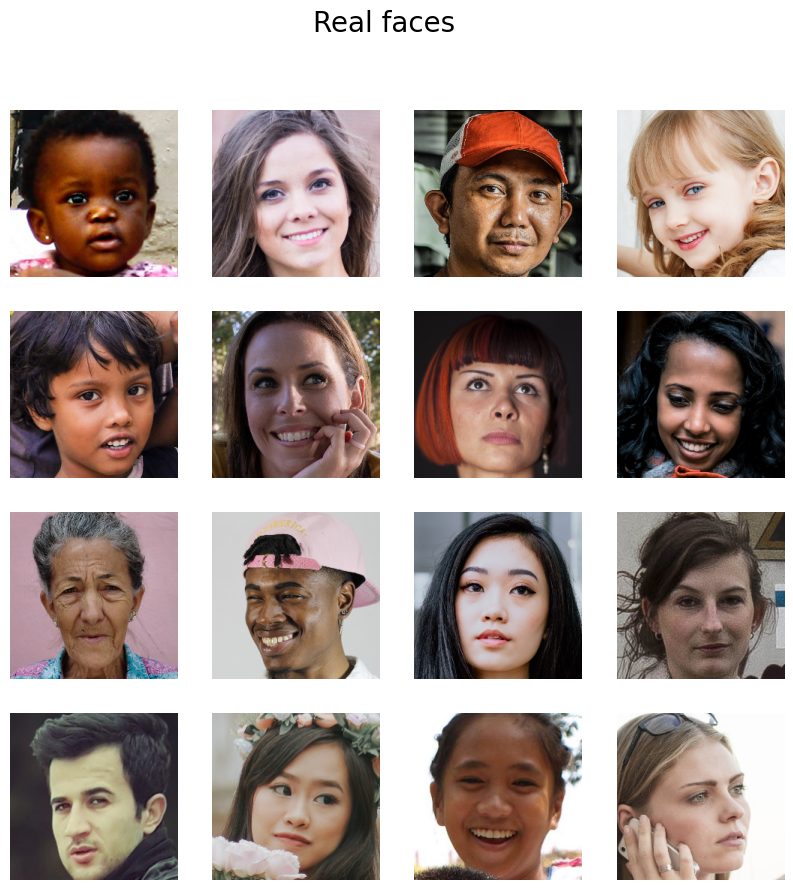

In [ ]:

fig = plt.figure(figsize=(10, 10))

for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(load_img(real +"/"+ real_path[i]), cmap='gray')
    plt.suptitle("Real faces",fontsize=20)
    plt.axis('off')

plt.show()

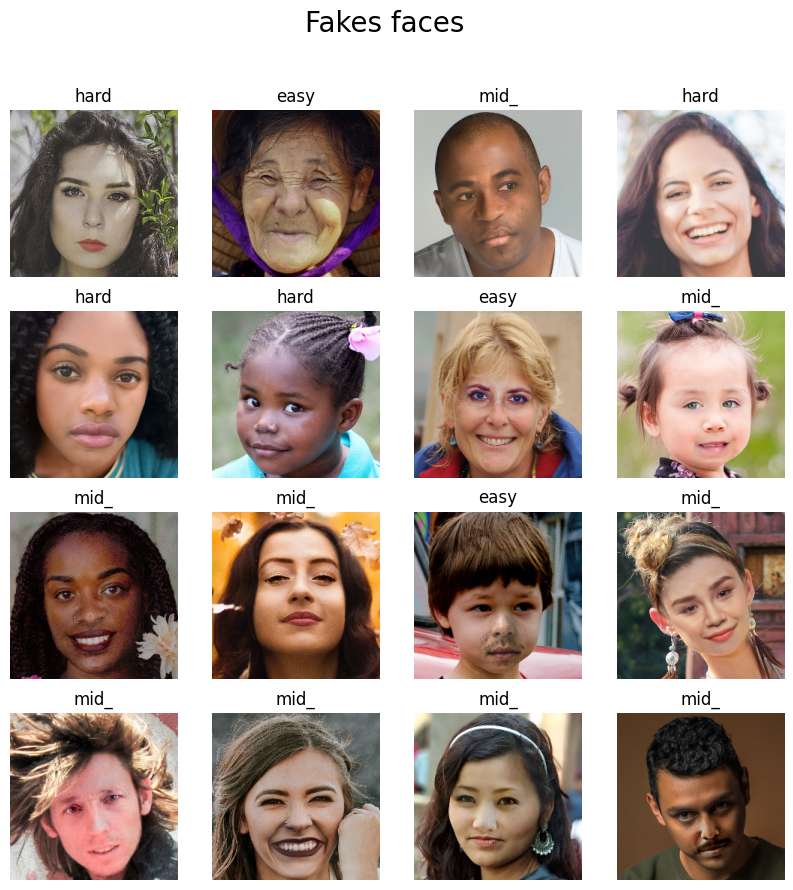

In [ ]:
fig = plt.figure(figsize=(10,10))

for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(load_img(fake + fake_path[i]), cmap='gray')
    plt.suptitle("Fakes faces",fontsize=20)
    plt.title(fake_path[i][:4])
    plt.axis('off')

plt.show()

In [ ]:
dataset_path = "/content/real-vs-fake-faces"

In [ ]:
data_with_aug = ImageDataGenerator(horizontal_flip=True,
                                   vertical_flip=False,
                                   rescale=1./255,
                                  validation_split=0.3)

In [ ]:

train = data_with_aug.flow_from_directory(dataset_path,
                                          class_mode="binary",
                                          target_size=(96, 96),
                                          batch_size=32,
                                          subset="training")

Found 1429 images belonging to 2 classes.


In [ ]:
val = data_with_aug.flow_from_directory(dataset_path,
                                          class_mode="binary",
                                          target_size=(96, 96),
                                          batch_size=32,
                                          subset="validation")

Found 612 images belonging to 2 classes.


#start with mobileNetV2

In [ ]:
mnet = MobileNetV2(include_top = False, weights = "imagenet" ,input_shape=(96,96,3))

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
tf.keras.backend.clear_session()

model = Sequential([mnet,
                    GlobalAveragePooling2D(),
                    Dense(512, activation = "relu"),
                    BatchNormalization(),
                    Dropout(0.3),
                    Dense(128, activation = "relu"),
                    Dropout(0.1),
                    # Dense(32, activation = "relu"),
                    # Dropout(0.3),
                    Dense(2, activation = "sigmoid")])

model.layers[0].trainable = False

model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics="accuracy")

model.summary()
Model: "sequential"

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_96 (Functi  (None, 3, 3, 1280)       2257984   
 onal)                                                           
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               655872    
                                                                 
 batch_normalization (BatchN  (None, 512)              2048      
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                        

In [ ]:

def scheduler(epoch):
    if epoch <= 2:
        return 0.001
    elif epoch > 2 and epoch <= 15:
        return 0.0001
    else:
        return 0.00001

lr_callbacks = tf.keras.callbacks.LearningRateScheduler(scheduler)
# print(lr_callbacks)

In [ ]:
hist = model.fit_generator(train,
                    epochs=10,
                    callbacks=[lr_callbacks],
                    validation_data=val)

<ipython-input-16-bcde76ea7c4d>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  hist = model.fit_generator(train,


Epoch 1/10
45/45 [==============================] - 39s 577ms/step - loss: 0.9163 - accuracy: 0.5850 - val_loss: 0.8051 - val_accuracy: 0.5474 - lr: 0.0010
Epoch 2/10
45/45 [==============================] - 17s 386ms/step - loss: 0.5382 - accuracy: 0.7362 - val_loss: 0.8541 - val_accuracy: 0.5261 - lr: 0.0010
Epoch 3/10
45/45 [==============================] - 16s 368ms/step - loss: 0.4543 - accuracy: 0.7852 - val_loss: 1.0553 - val_accuracy: 0.4918 - lr: 0.0010
Epoch 4/10
45/45 [==============================] - 17s 380ms/step - loss: 0.3586 - accuracy: 0.8481 - val_loss: 1.0094 - val_accuracy: 0.5212 - lr: 1.0000e-04
Epoch 5/10
45/45 [==============================] - 17s 379ms/step - loss: 0.3219 - accuracy: 0.8663 - val_loss: 0.9740 - val_accuracy: 0.5245 - lr: 1.0000e-04
Epoch 6/10
45/45 [==============================] - 17s 378ms/step - loss: 0.3080 - accuracy: 0.8747 - val_loss: 0.9725 - val_accuracy: 0.5458 - lr: 1.0000e-04
Epoch 7/10
45/45 [==============================] - 

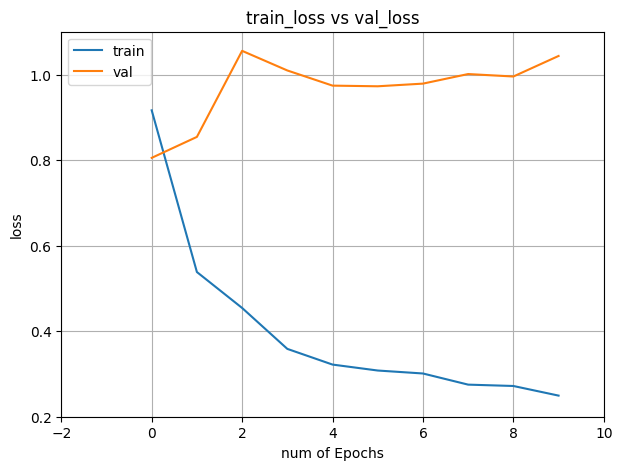

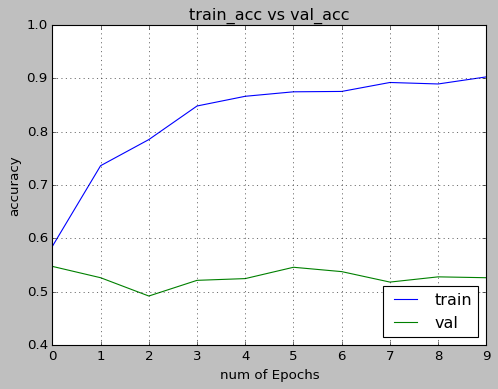

In [ ]:
epochs = 10
train_loss = hist.history['loss']
val_loss = hist.history['val_loss']
train_acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
xc = range(epochs)

plt.figure(1,figsize=(7,5))
plt.plot(xc,train_loss)
plt.plot(xc,val_loss)
plt.xlabel('num of Epochs')
plt.ylabel('loss')
plt.title('train_loss vs val_loss')
plt.grid(True)
plt.legend(['train','val'])

plt.style.use(['classic'])

plt.figure(2,figsize=(7,5))
plt.plot(xc,train_acc)
plt.plot(xc,val_acc)
plt.xlabel('num of Epochs')
plt.ylabel('accuracy')
plt.title('train_acc vs val_acc')
plt.grid(True)
plt.legend(['train','val'],loc=4)

plt.style.use(['classic'])

#VGG16

In [ ]:
train = data_with_aug.flow_from_directory(dataset_path,
                                          class_mode="binary",
                                          target_size=(224, 224),
                                          batch_size=98,
                                          subset="training")

val = data_with_aug.flow_from_directory(dataset_path,
                                          class_mode="binary",
                                          target_size=(224, 224),
                                          batch_size=98,
                                          subset="validation"
                                          )

Found 1429 images belonging to 2 classes.
Found 612 images belonging to 2 classes.


In [ ]:
vgg16_model = tf.keras.applications.vgg16.VGG16(include_top=False, weights="imagenet", input_shape=(224,224,3))

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
vgg16_model.output[-1]

<KerasTensor: shape=(7, 7, 512) dtype=float32 (created by layer 'tf.__operators__.getitem')>

In [ ]:

model = Sequential([vgg16_model,
                    Flatten(),
#                     GlobalAveragePooling2D(),
#                     Dense(512, activation = "relu"),
#                     BatchNormalization(),
#                     Dropout(0.3),
#                     Dense(128, activation = "relu"),
#                     Dropout(0.1),
#                     # Dense(32, activation = "relu"),
#                     # Dropout(0.3),
                    Dense(2, activation = "sigmoid")])

model.layers[0].trainable = False

model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics="accuracy")

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense_3 (Dense)             (None, 2)                 50178     
                                                                 
Total params: 14,764,866
Trainable params: 50,178
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
hist =  model.fit_generator(train,
                    epochs=20,
                    callbacks=[lr_callbacks],
                    validation_data=val)

<ipython-input-22-598b8c2f3cde>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  hist =  model.fit_generator(train,


Epoch 1/20
15/15 [==============================] - 52s 3s/step - loss: 1.3746 - accuracy: 0.5409 - val_loss: 0.8389 - val_accuracy: 0.5605 - lr: 0.0010
Epoch 2/20
15/15 [==============================] - 30s 2s/step - loss: 0.6636 - accuracy: 0.6963 - val_loss: 0.8562 - val_accuracy: 0.5572 - lr: 0.0010
Epoch 3/20
15/15 [==============================] - 25s 2s/step - loss: 0.5169 - accuracy: 0.7383 - val_loss: 0.7705 - val_accuracy: 0.5752 - lr: 0.0010
Epoch 4/20
15/15 [==============================] - 22s 1s/step - loss: 0.4499 - accuracy: 0.8034 - val_loss: 0.7792 - val_accuracy: 0.5768 - lr: 1.0000e-04
Epoch 5/20
15/15 [==============================] - 21s 1s/step - loss: 0.4475 - accuracy: 0.8013 - val_loss: 0.7707 - val_accuracy: 0.5915 - lr: 1.0000e-04
Epoch 6/20
15/15 [==============================] - 28s 2s/step - loss: 0.4406 - accuracy: 0.8041 - val_loss: 0.7783 - val_accuracy: 0.5735 - lr: 1.0000e-04
Epoch 7/20
15/15 [==============================] - 30s 2s/step - loss

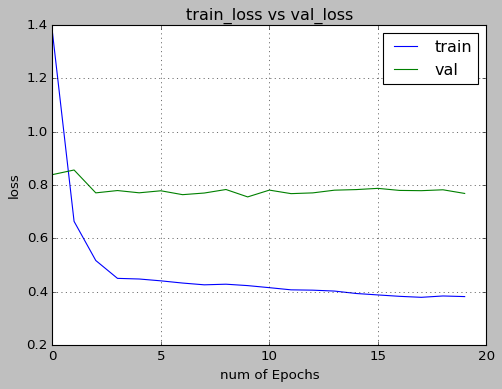

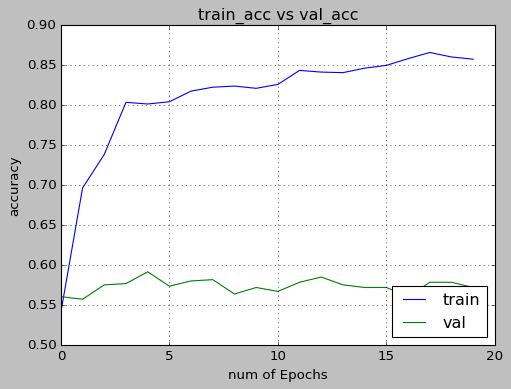

In [ ]:
epochs = 20
train_loss = hist.history['loss']
val_loss = hist.history['val_loss']
train_acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
xc = range(epochs)

plt.figure(1,figsize=(7,5))
plt.plot(xc,train_loss)
plt.plot(xc,val_loss)
plt.xlabel('num of Epochs')
plt.ylabel('loss')
plt.title('train_loss vs val_loss')
plt.grid(True)
plt.legend(['train','val'])
plt.style.use(['classic'])
plt.figure(2,figsize=(7,5))
plt.plot(xc,train_acc)
plt.plot(xc,val_acc)
plt.xlabel('num of Epochs')
plt.ylabel('accuracy')
plt.title('train_acc vs val_acc')
plt.grid(True)
plt.legend(['train','val'],loc=4)
plt.style.use(['classic'])

In [ ]:
#Creating an array of predicted test images

predictions = model.predict_generator(val)

<ipython-input-24-a5c5724c89c6>:3: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predictions = model.predict_generator(val)


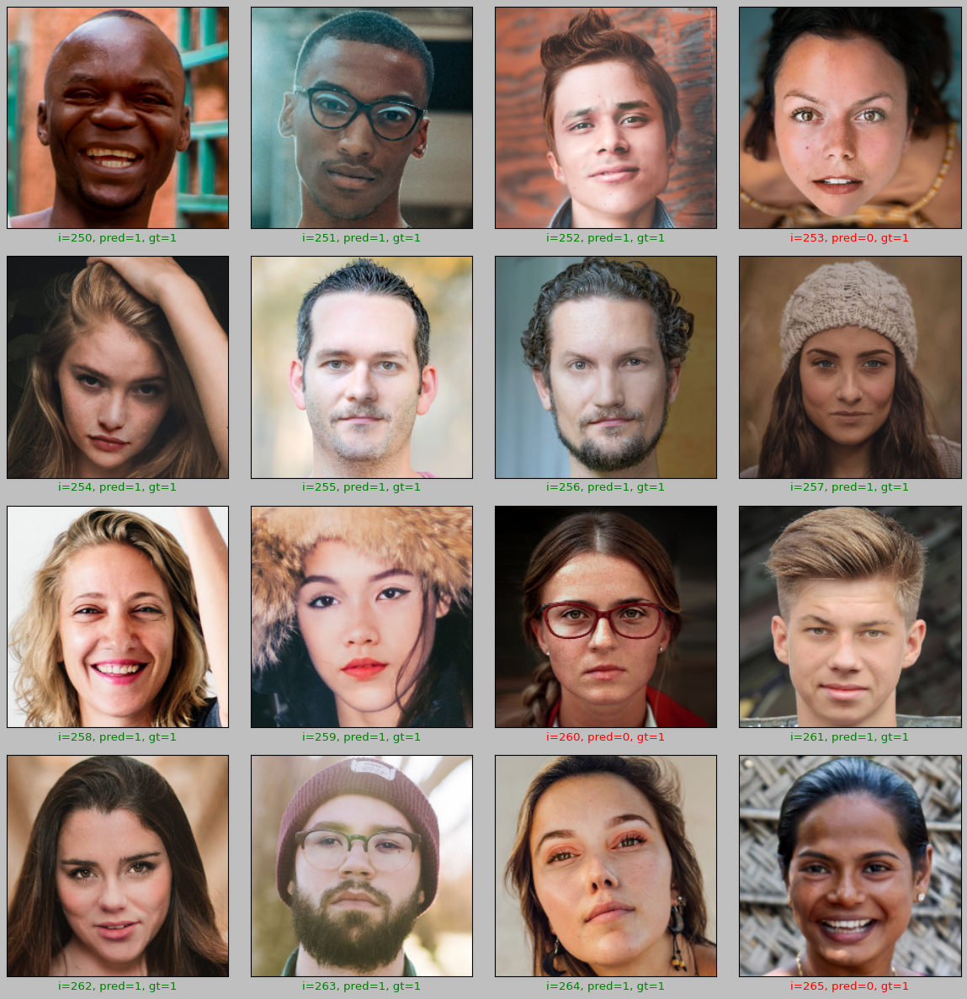

In [ ]:


val_path = "/content/real-vs-fake-faces"

plt.figure(figsize=(15,15))

start_index = 250

for i in range(16):
  plt.subplot(4,4, i+1)
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  preds = np.argmax(predictions[[start_index+i]])

  gt = val.filenames[start_index+i][9:13]


  if gt == "fake":
    gt = 0
  else:
    gt = 1

  if preds != gt:
    col ="r"
  else:
    col = "g"

  plt.xlabel('i={}, pred={}, gt={}'.format(start_index+i,preds,gt),color=col)
  plt.imshow(load_img(val_path+"//"+val.filenames[start_index+i]))
  plt.tight_layout()

plt.show()

# resnet50

In [ ]:
import numpy as np
import cv2 as cv
import os

import matplotlib.pyplot as plt

# tensorflow
import tensorflow.keras as keras
import tensorflow as tf

# image processing
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img

# model / neural network
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

In [ ]:
# ResNet50 model
resnet_50 = ResNet50(include_top=False, weights='imagenet', input_shape=(224,224,3))
for layer in resnet_50.layers:
    layer.trainable = False

94765736/94765736 [==============================] - 1s 0us/step


In [ ]:
# build the entire model
x = resnet_50.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(64, activation='relu')(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(2, activation='sigmoid')(x)
model = Model(inputs = resnet_50.input, outputs = predictions)

In [ ]:
# define training function
def trainModel(model, epochs, optimizer):
    batch_size = 32
    model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"])
    return model.fit(train, validation_data=val, epochs=epochs, batch_size=batch_size)

In [ ]:
# launch the training
model_history = trainModel(model = model, epochs = 10, optimizer = "Adam")

Epoch 1/10
15/15 [==============================] - 34s 2s/step - loss: 0.8617 - accuracy: 0.5290 - val_loss: 0.6933 - val_accuracy: 0.5294
Epoch 2/10
15/15 [==============================] - 24s 2s/step - loss: 0.7400 - accuracy: 0.5094 - val_loss: 0.6918 - val_accuracy: 0.5294
Epoch 3/10
15/15 [==============================] - 24s 2s/step - loss: 0.7152 - accuracy: 0.5171 - val_loss: 0.6915 - val_accuracy: 0.5294
Epoch 4/10
15/15 [==============================] - 21s 1s/step - loss: 0.6996 - accuracy: 0.5206 - val_loss: 0.6918 - val_accuracy: 0.5294
Epoch 5/10
15/15 [==============================] - 26s 2s/step - loss: 0.7056 - accuracy: 0.5038 - val_loss: 0.6918 - val_accuracy: 0.5294
Epoch 6/10
15/15 [==============================] - 30s 2s/step - loss: 0.7054 - accuracy: 0.4913 - val_loss: 0.6924 - val_accuracy: 0.5294
Epoch 7/10
15/15 [==============================] - 20s 1s/step - loss: 0.6983 - accuracy: 0.5045 - val_loss: 0.6925 - val_accuracy: 0.5294
Epoch 8/10
15/15 [==

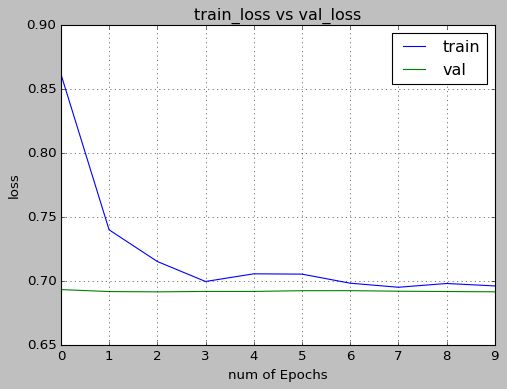

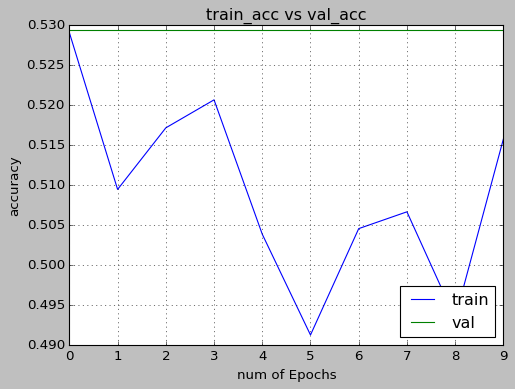

In [ ]:


epochs = 10
train_loss = model_history.history['loss']
val_loss = model_history.history['val_loss']
train_acc = model_history.history['accuracy']
val_acc = model_history.history['val_accuracy']
xc = range(epochs)

plt.figure(1,figsize=(7,5))
plt.plot(xc,train_loss)
plt.plot(xc,val_loss)
plt.xlabel('num of Epochs')
plt.ylabel('loss')
plt.title('train_loss vs val_loss')
plt.grid(True)
plt.legend(['train','val'])

plt.style.use(['classic'])

plt.figure(2,figsize=(7,5))
plt.plot(xc,train_acc)
plt.plot(xc,val_acc)
plt.xlabel('num of Epochs')
plt.ylabel('accuracy')
plt.title('train_acc vs val_acc')
plt.grid(True)
plt.legend(['train','val'],loc=4)
plt.style.use(['classic'])

#VGG19

In [ ]:
vgg19_model = tf.keras.applications.vgg19.VGG19(include_top=False, weights="imagenet", input_shape=(224,224,3))

80134624/80134624 [==============================] - 0s 0us/step


In [ ]:
vgg19_model.output[-1]

<KerasTensor: shape=(7, 7, 512) dtype=float32 (created by layer 'tf.__operators__.getitem_1')>

In [ ]:

model = Sequential([vgg19_model,
                    Flatten(),
#                     GlobalAveragePooling2D(),
#                     Dense(512, activation = "relu"),
#                     BatchNormalization(),
#                     Dropout(0.3),
#                     Dense(128, activation = "relu"),
#                     Dropout(0.1),
#                     # Dense(32, activation = "relu"),
#                     # Dropout(0.3),
                    Dense(2, activation = "sigmoid")])

model.layers[0].trainable = False

model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics="accuracy")

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_9 (Dense)             (None, 2)                 50178     
                                                                 
Total params: 20,074,562
Trainable params: 50,178
Non-trainable params: 20,024,384
_________________________________________________________________


In [ ]:
hist =  model.fit_generator(train,
                    epochs=20,
                    callbacks=[lr_callbacks],
                    validation_data=val)

<ipython-input-35-598b8c2f3cde>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  hist =  model.fit_generator(train,


Epoch 1/20
15/15 [==============================] - 31s 2s/step - loss: 1.5849 - accuracy: 0.5248 - val_loss: 1.0279 - val_accuracy: 0.5408 - lr: 0.0010
Epoch 2/20
15/15 [==============================] - 28s 2s/step - loss: 0.7676 - accuracy: 0.6298 - val_loss: 0.9565 - val_accuracy: 0.5490 - lr: 0.0010
Epoch 3/20
15/15 [==============================] - 21s 1s/step - loss: 0.5786 - accuracy: 0.6991 - val_loss: 0.7711 - val_accuracy: 0.5784 - lr: 0.0010
Epoch 4/20
15/15 [==============================] - 22s 1s/step - loss: 0.5111 - accuracy: 0.7558 - val_loss: 0.7712 - val_accuracy: 0.5556 - lr: 1.0000e-04
Epoch 5/20
15/15 [==============================] - 22s 1s/step - loss: 0.4874 - accuracy: 0.7621 - val_loss: 0.7654 - val_accuracy: 0.5686 - lr: 1.0000e-04
Epoch 6/20
15/15 [==============================] - 22s 1s/step - loss: 0.4805 - accuracy: 0.7740 - val_loss: 0.7413 - val_accuracy: 0.5882 - lr: 1.0000e-04
Epoch 7/20
15/15 [==============================] - 22s 1s/step - loss

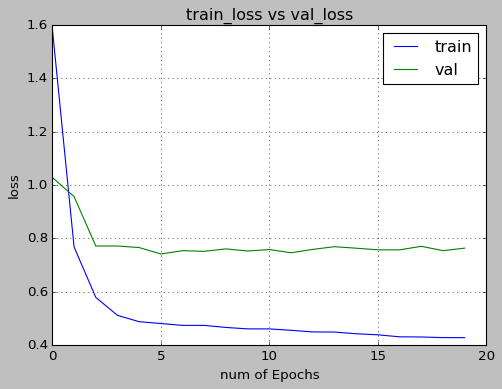

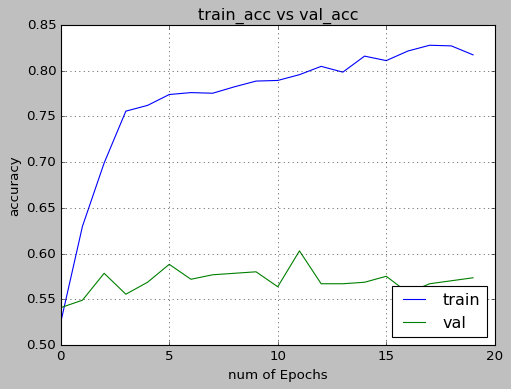

In [ ]:

epochs = 20
train_loss = hist.history['loss']
val_loss = hist.history['val_loss']
train_acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
xc = range(epochs)

plt.figure(1,figsize=(7,5))
plt.plot(xc,train_loss)
plt.plot(xc,val_loss)
plt.xlabel('num of Epochs')
plt.ylabel('loss')
plt.title('train_loss vs val_loss')
plt.grid(True)
plt.legend(['train','val'])
plt.style.use(['classic'])

plt.figure(2,figsize=(7,5))
plt.plot(xc,train_acc)
plt.plot(xc,val_acc)
plt.xlabel('num of Epochs')
plt.ylabel('accuracy')
plt.title('train_acc vs val_acc')
plt.grid(True)
plt.legend(['train','val'],loc=4)
plt.style.use(['classic'])

In [ ]:
#Creating an array of predicted test images

predictions = model.predict_generator(val)

<ipython-input-37-a5c5724c89c6>:3: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predictions = model.predict_generator(val)


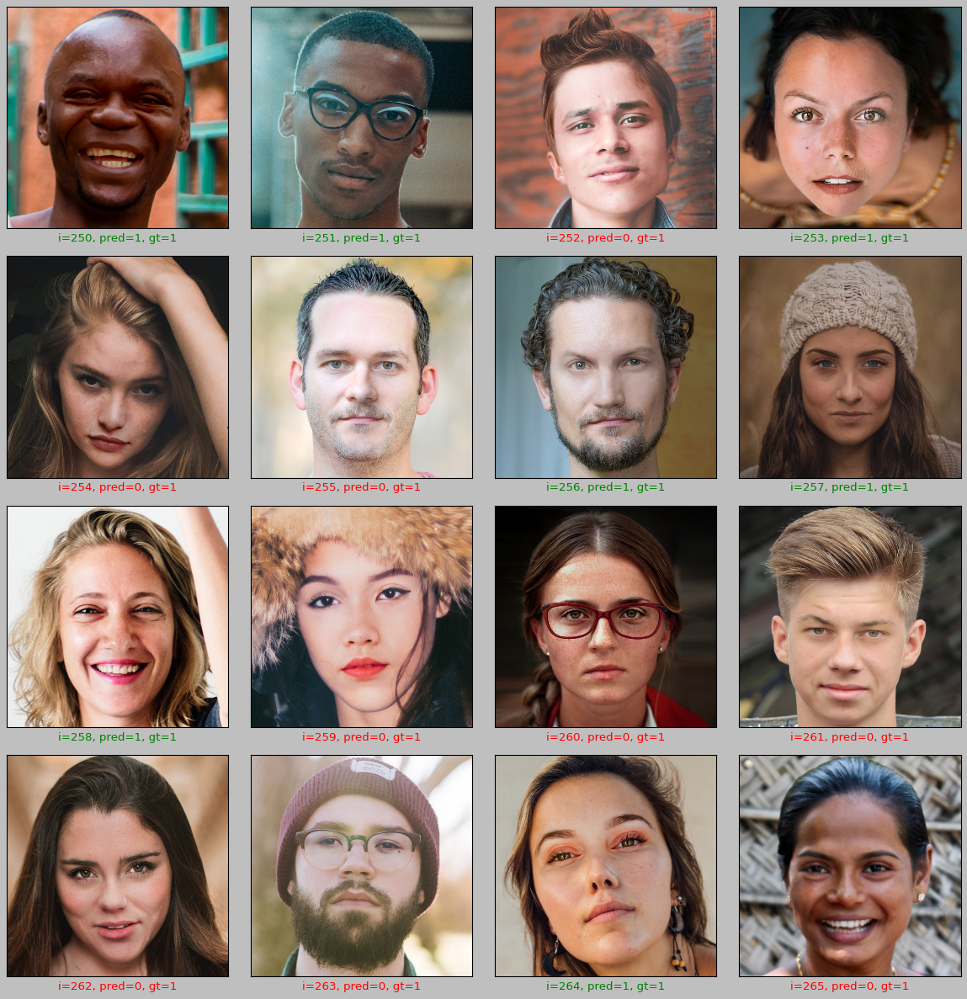

In [ ]:

val_path = "/content/real-vs-fake-faces"

plt.figure(figsize=(15,15))

start_index = 250

for i in range(16):
  plt.subplot(4,4, i+1)
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  preds = np.argmax(predictions[[start_index+i]])

  gt = val.filenames[start_index+i][9:13]


  if gt == "fake":
    gt = 0
  else:
    gt = 1

  if preds != gt:
    col ="r"
  else:
    col = "g"

  plt.xlabel('i={}, pred={}, gt={}'.format(start_index+i,preds,gt),color=col)
  plt.imshow(load_img(val_path+"//"+val.filenames[start_index+i]))
  plt.tight_layout()

plt.show()

#cusom CNN

In [ ]:
import numpy as np
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

import warnings
warnings.filterwarnings("ignore")

In [ ]:
model = Sequential()

model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(224,224,3)))
model.add(MaxPooling2D())
model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())
model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

loss = loss=tf.losses.BinaryCrossentropy()
model.compile(loss=loss, optimizer='adam',  metrics=["accuracy"])

In [ ]:
model.summary()



Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 16)        4624      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 16)      

In [ ]:
logdir='logs'
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [ ]:
hist = model.fit(train, epochs=8, validation_data=val, callbacks=[tensorboard_callback])

Epoch 1/8
15/15 [==============================] - 24s 1s/step - loss: 0.8391 - accuracy: 0.4983 - val_loss: 0.6916 - val_accuracy: 0.5294
Epoch 2/8
15/15 [==============================] - 18s 1s/step - loss: 0.6914 - accuracy: 0.5423 - val_loss: 0.6927 - val_accuracy: 0.5294
Epoch 3/8
15/15 [==============================] - 18s 1s/step - loss: 0.6815 - accuracy: 0.6018 - val_loss: 0.6939 - val_accuracy: 0.5163
Epoch 4/8
15/15 [==============================] - 18s 1s/step - loss: 0.6543 - accuracy: 0.6179 - val_loss: 0.7803 - val_accuracy: 0.5065
Epoch 5/8
15/15 [==============================] - 18s 1s/step - loss: 0.6720 - accuracy: 0.5759 - val_loss: 0.7039 - val_accuracy: 0.5098
Epoch 6/8
15/15 [==============================] - 23s 2s/step - loss: 0.6573 - accuracy: 0.6137 - val_loss: 0.7214 - val_accuracy: 0.5114
Epoch 7/8
15/15 [==============================] - 18s 1s/step - loss: 0.6359 - accuracy: 0.6277 - val_loss: 0.8086 - val_accuracy: 0.5327
Epoch 8/8
15/15 [==========

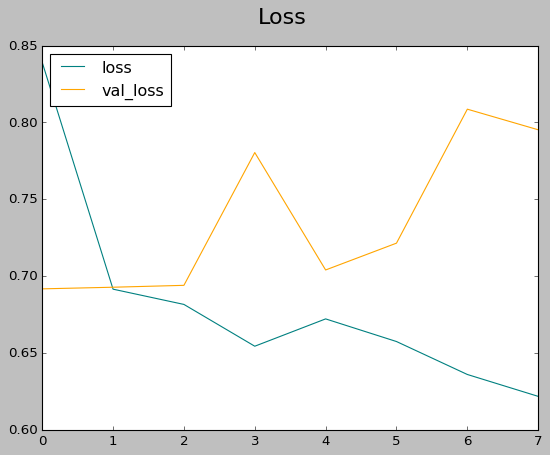

In [ ]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

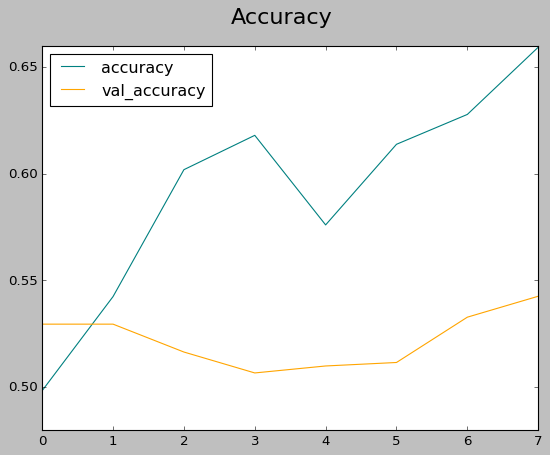

In [ ]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

In [ ]:
loss, accuracy = model.evaluate(val)

7/7 [==============================] - 5s 711ms/step - loss: 0.8072 - accuracy: 0.5294


In [ ]:
print("Loss: ", loss)
print("Accuracy: ", accuracy)

Loss:  0.8072181344032288
Accuracy:  0.529411792755127


#DensNet121

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten, GlobalAveragePooling2D
from tensorflow.keras.applications.densenet import DenseNet121

In [ ]:


# Load DenseNet121 model (pre-trained on ImageNet)
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224,224,3))

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dense(64, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


model.summary()


29084464/29084464 [==============================] - 0s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_4[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                           

In [ ]:
# Train the model
model.fit(train, batch_size=32, epochs=10, validation_data=val)


Epoch 1/10
15/15 [==============================] - 38s 2s/step - loss: 0.6837 - accuracy: 0.5717 - val_loss: 0.7037 - val_accuracy: 0.5114
Epoch 2/10
15/15 [==============================] - 19s 1s/step - loss: 0.6215 - accuracy: 0.6655 - val_loss: 0.7048 - val_accuracy: 0.5474
Epoch 3/10
15/15 [==============================] - 20s 1s/step - loss: 0.5906 - accuracy: 0.6823 - val_loss: 0.7329 - val_accuracy: 0.5474
Epoch 4/10
15/15 [==============================] - 19s 1s/step - loss: 0.5558 - accuracy: 0.7320 - val_loss: 0.7367 - val_accuracy: 0.5539
Epoch 5/10
15/15 [==============================] - 20s 1s/step - loss: 0.5490 - accuracy: 0.7061 - val_loss: 0.7451 - val_accuracy: 0.5376
Epoch 6/10
15/15 [==============================] - 24s 2s/step - loss: 0.5190 - accuracy: 0.7418 - val_loss: 0.8130 - val_accuracy: 0.5490
Epoch 7/10
15/15 [==============================] - 24s 2s/step - loss: 0.4955 - accuracy: 0.7684 - val_loss: 0.7654 - val_accuracy: 0.5425
Epoch 8/10
15/15 [==

In [ ]:
loss, accuracy = model.evaluate(val)

7/7 [==============================] - 6s 755ms/step - loss: 0.9666 - accuracy: 0.5343


In [ ]:
print(loss)
print(accuracy)

0.9666399955749512
0.5343137383460999


In [ ]:
#Creating an array of predicted test images

predictions = model.predict_generator(val)

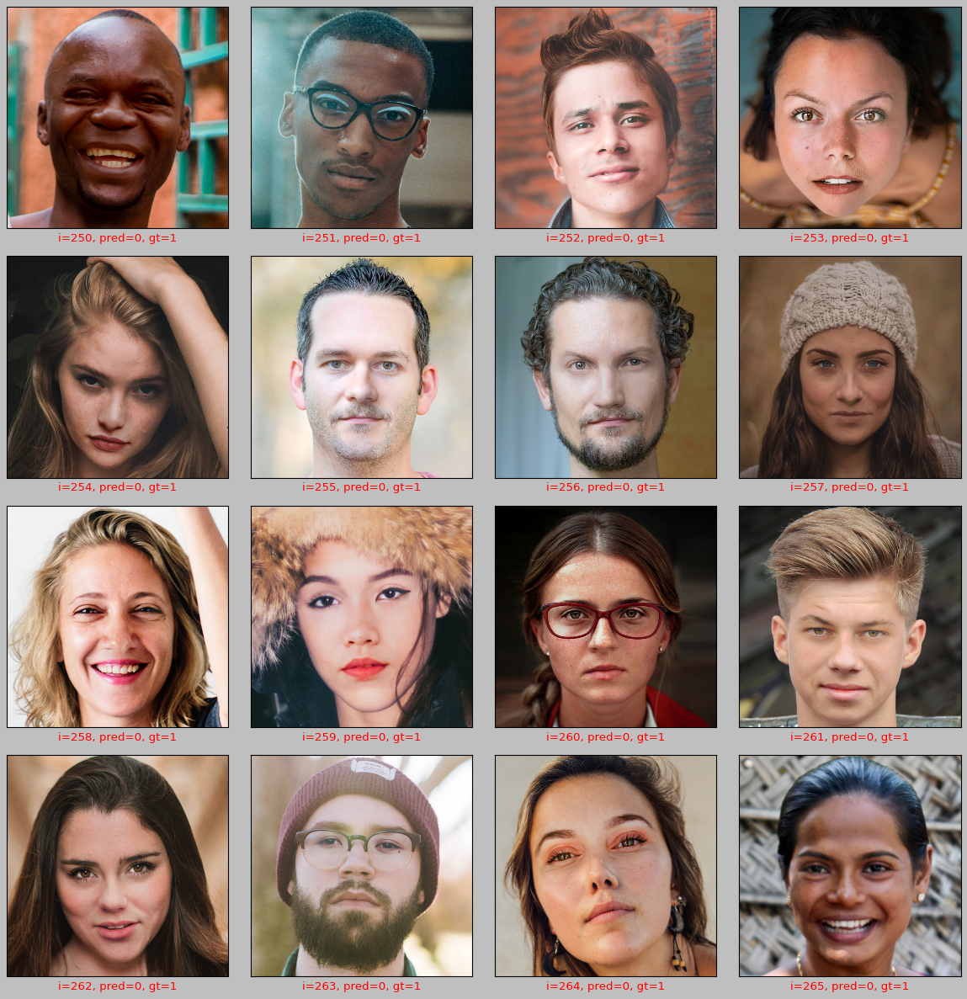

In [ ]:

val_path = "/content/real-vs-fake-faces"

plt.figure(figsize=(15,15))

start_index = 250

for i in range(16):
  plt.subplot(4,4, i+1)
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  preds = np.argmax(predictions[[start_index+i]])

  gt = val.filenames[start_index+i][9:13]


  if gt == "fake":
    gt = 0
  else:
    gt = 1

  if preds != gt:
    col ="r"
  else:
    col = "g"

  plt.xlabel('i={}, pred={}, gt={}'.format(start_index+i,preds,gt),color=col)
  plt.imshow(load_img(val_path+"//"+val.filenames[start_index+i]))
  plt.tight_layout()

plt.show()

#start with new dataset


In [ ]:
import os

real_data = "/content/Deepfake-detection/data/Real"
fake_data = "/content/Deepfake-detection/data/DeepFake"

real_path = os.listdir(real_data)
fake_path = os.listdir(fake_data)

In [ ]:
import os
import random
import shutil

# Set the paths for your dataset folders
data_dir = "/content/Deepfake-detection/data"
train_dir = "/content/Deepfake-detection/data/train"
val_dir = "/content/Deepfake-detection/data/valid"
real_train="/content/Deepfake-detection/data/train/real"
fake_train="/content/Deepfake-detection/data/train/fake"
real_val="/content/Deepfake-detection/data/valid/real"
fake_val="/content/Deepfake-detection/data/valid/fake"

# Create the train and validation directories if they don't exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

os.makedirs(real_train, exist_ok=True)
os.makedirs(fake_train, exist_ok=True)

os.makedirs(real_val, exist_ok=True)
os.makedirs(fake_val, exist_ok=True)


In [ ]:
# List all files in the cat and dog folders
real_files = os.listdir(os.path.join(data_dir, 'Real'))
fake_files = os.listdir(os.path.join(data_dir, 'DeepFake'))

# Set the ratio for splitting the data (e.g., 80% for training, 20% for validation)
split_ratio = 0.8

# Calculate the number of samples for each class in training and validation sets
num_real_train = int(len(real_files) * split_ratio)
num_fake_train = int(len(fake_files) * split_ratio)

# Shuffle the lists of cat and dog files
random.shuffle(real_files)
random.shuffle(fake_files)

# Move cat files to the training directory
for real_file in real_files[:num_real_train]:
    src = os.path.join(data_dir, 'Real', real_file)
    dst = os.path.join(train_dir, 'real', real_file)
    shutil.copy(src, dst)

# Move dog files to the training directory
for fake_file in fake_files[:num_fake_train]:
    src = os.path.join(data_dir, 'DeepFake', fake_file)
    dst = os.path.join(train_dir, 'fake', fake_file)
    shutil.copy(src, dst)

# Move remaining cat files to the validation directory
for real_file in real_files[num_real_train:]:
    src = os.path.join(data_dir, 'Real', real_file)
    dst = os.path.join(val_dir, 'real', real_file)
    shutil.copy(src, dst)

# Move remaining dog files to the validation directory
for fake_file in fake_files[num_fake_train:]:
    src = os.path.join(data_dir, 'DeepFake', fake_file)
    dst = os.path.join(val_dir, 'fake', fake_file)
    shutil.copy(src, dst)

print("Data splitting complete!")


Data splitting complete!


In [ ]:
print(len(os.listdir(real_train)))
print(len(os.listdir(fake_train)))
print(len(os.listdir(real_val)))
print(len(os.listdir(fake_val)))


3407
2276
852
569


In [ ]:
# define function for loading new image
def loading_image(path):
    image = cv2.imread(path)
    image = cv2.resize(image,(256, 256))
    return image[...,::-1]

In [ ]:


real_data = "/content/Deepfake-detection/data/Real"
fake_data = "/content/Deepfake-detection/data/DeepFake"

real_path = os.listdir(real_data)
fake_path = os.listdir(fake_data)

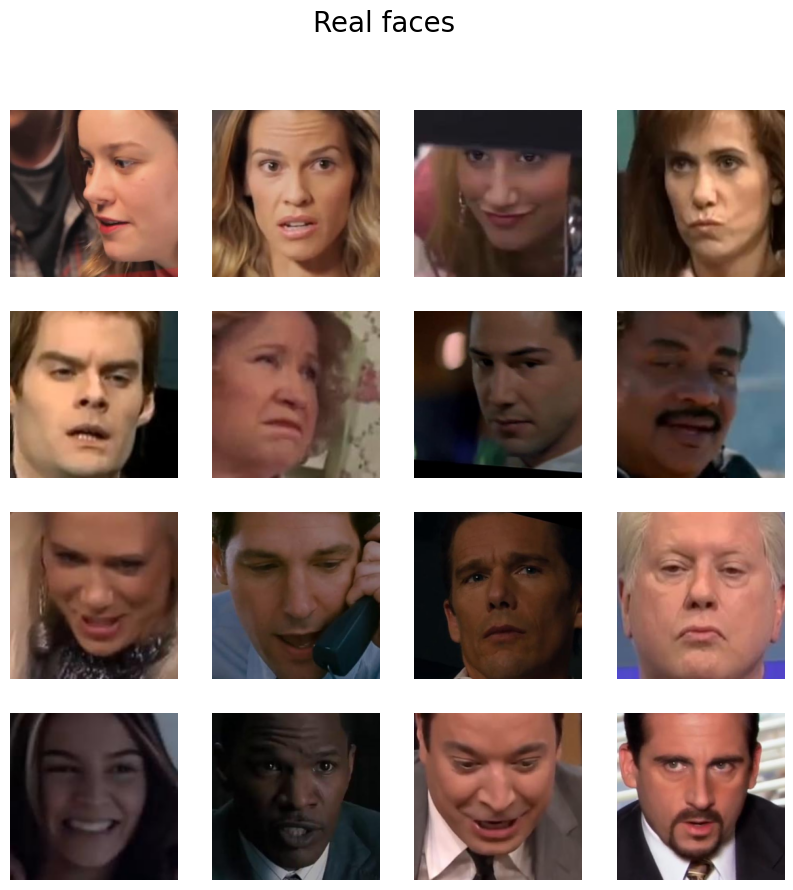

In [ ]:
fig = plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(loading_image(real_data +"/"+ real_path[i]), cmap='gray')
    plt.suptitle("Real faces",fontsize=20)
    plt.axis('off')

plt.show()

In [ ]:

fig = plt.figure(figsize=(10, 10))

for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(loading_image(fake_data +"/"+ fake_path[i]), cmap='gray')
    plt.suptitle("fake faces",fontsize=20)
    plt.axis('off')

plt.show()

#Apply some prerpocessing for the new data set

In [ ]:
dataGenerator = ImageDataGenerator(rescale=1./255)

augmented_data = dataGenerator.flow_from_directory(
    '/content/Deepfake-detection/data/train',
    target_size=(256, 256),
    batch_size=1,
    class_mode='binary')

# Re-checking class assignment after removing it
augmented_data.class_indices

Found 5683 images belonging to 2 classes.


{'fake': 0, 'real': 1}

In [ ]:
valid = dataGenerator.flow_from_directory(
    '/content/Deepfake-detection/data/valid',
    target_size=(256, 256),
    batch_size=1,
    class_mode='binary')


Found 1421 images belonging to 2 classes.


In [ ]:
#define the image dimentions as dictionary
image_dimensions = {'height':256, 'width':256, 'channels':3}

#Start With fitting the CNN model within the new data

In [ ]:
# weight_path="/content/weights/Meso4_DF"

In [ ]:
x = Input(shape = (image_dimensions['height'],
                           image_dimensions['width'],
                           image_dimensions['channels']))

x1 = Conv2D(8, (3, 3), padding='same', activation = 'relu')(x)
x1 = BatchNormalization()(x1)
x1 = MaxPooling2D(pool_size=(2, 2), padding='same')(x1)

x2 = Conv2D(8, (5, 5), padding='same', activation = 'relu')(x1)
x2 = BatchNormalization()(x2)
x2 = MaxPooling2D(pool_size=(2, 2), padding='same')(x2)

x3 = Conv2D(16, (5, 5), padding='same', activation = 'relu')(x2)
x3 = BatchNormalization()(x3)
x3 = MaxPooling2D(pool_size=(2, 2), padding='same')(x3)

x4 = Conv2D(16, (5, 5), padding='same', activation = 'relu')(x3)
x4 = BatchNormalization()(x4)
x4 = MaxPooling2D(pool_size=(4, 4), padding='same')(x4)

y = Flatten()(x4)
y = Dropout(0.5)(y)
y = Dense(16)(y)
y = LeakyReLU(alpha=0.1)(y)
y = Dropout(0.5)(y)
y = Dense(1, activation = 'sigmoid')(y)
model=Model(inputs = x, outputs = y)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# model.load_weights(weight_path)

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 8)       224       
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 8)      32        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 8)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 8)       1608      
                                                                 
 batch_normalization_1 (Batc  (None, 128, 128, 8)      32    

In [ ]:
hist = model.fit(augmented_data,epochs=10,validation_data=valid)

Epoch 1/10
6816/6816 [==============================] - 76s 9ms/step - loss: 0.3172 - accuracy: 0.8710 - val_loss: 0.5486 - val_accuracy: 0.8417
Epoch 2/10
6816/6816 [==============================] - 63s 9ms/step - loss: 0.1575 - accuracy: 0.9451 - val_loss: 0.6314 - val_accuracy: 0.8424
Epoch 3/10
6816/6816 [==============================] - 56s 8ms/step - loss: 0.1078 - accuracy: 0.9660 - val_loss: 0.4694 - val_accuracy: 0.8220
Epoch 4/10
6816/6816 [==============================] - 55s 8ms/step - loss: 0.0983 - accuracy: 0.9677 - val_loss: 1.6839 - val_accuracy: 0.8079
Epoch 5/10
6816/6816 [==============================] - 61s 9ms/step - loss: 0.0846 - accuracy: 0.9723 - val_loss: 1.1899 - val_accuracy: 0.7727
Epoch 6/10
6816/6816 [==============================] - 56s 8ms/step - loss: 0.0777 - accuracy: 0.9762 - val_loss: 1.2093 - val_accuracy: 0.8086
Epoch 7/10
6816/6816 [==============================] - 56s 8ms/step - loss: 0.0648 - accuracy: 0.9777 - val_loss: 1.6063 - val_ac

In [ ]:
X, y = valid.next()

#Make some prediction

1/1 [==============================] - 3s 3s/step
Predicted likelihood: 0.5039
Actual label: 1
1/1 [==============================] - 0s 65ms/step

Correct prediction: True


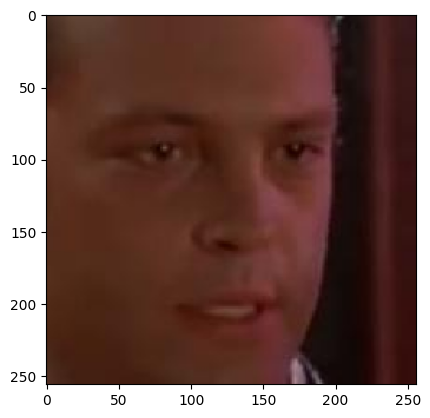

In [ ]:
# Evaluating prediction
print(f"Predicted likelihood: {model.predict(X)[0][0]:.4f}")
print(f"Actual label: {int(y[0])}")
print(f"\nCorrect prediction: {round(model.predict(X)[0][0])==y[0]}")

# Showing image
plt.imshow(np.squeeze(X));

#End with CNN

#Now within MobileNet

In [ ]:
mnet = MobileNetV2(include_top = False, weights = "imagenet" ,input_shape=(256,256,3))

In [ ]:
tf.keras.backend.clear_session()

model = Sequential([mnet,
                    GlobalAveragePooling2D(),
                    Dense(512, activation = "relu"),
                    BatchNormalization(),
                    Dropout(0.3),
                    Dense(128, activation = "relu"),
                    Dropout(0.1),
                    Dense(32, activation = "relu"),
                    Dropout(0.3),
                    Dense(2, activation = "sigmoid")])

model.layers[0].trainable = False

model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics="accuracy")

model.summary()
Model: "sequential"

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_256 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               655872    
                                                                 
 batch_normalization (BatchN  (None, 512)              2048      
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                        

In [ ]:

def scheduler(epoch):
    if epoch <= 2:
        return 0.001
    elif epoch > 2 and epoch <= 15:
        return 0.0001
    else:
        return 0.00001

lr_callbacks = tf.keras.callbacks.LearningRateScheduler(scheduler)
# print(lr_callbacks)

In [ ]:
hist = model.fit_generator(augmented_data,
                    epochs=6,
                    callbacks=[lr_callbacks],
                    validation_data=valid)

Epoch 1/6


<ipython-input-50-9e658f714e87>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  hist = model.fit_generator(augmented_data,


7048/7048 [==============================] - 188s 14ms/step - loss: 0.6755 - accuracy: 0.5973 - val_loss: 0.6749 - val_accuracy: 0.5953 - lr: 0.0010
Epoch 2/6
7048/7048 [==============================] - 103s 15ms/step - loss: 0.6738 - accuracy: 0.5988 - val_loss: 0.6750 - val_accuracy: 0.5953 - lr: 0.0010
Epoch 3/6
7048/7048 [==============================] - 93s 13ms/step - loss: 0.6739 - accuracy: 0.5988 - val_loss: 0.6749 - val_accuracy: 0.5953 - lr: 0.0010
Epoch 4/6
7048/7048 [==============================] - 89s 13ms/step - loss: 0.6736 - accuracy: 0.5988 - val_loss: 0.6749 - val_accuracy: 0.5953 - lr: 1.0000e-04
Epoch 5/6
7048/7048 [==============================] - 94s 13ms/step - loss: 0.6736 - accuracy: 0.5988 - val_loss: 0.6749 - val_accuracy: 0.5953 - lr: 1.0000e-04
Epoch 6/6
7048/7048 [==============================] - 89s 13ms/step - loss: 0.6736 - accuracy: 0.5988 - val_loss: 0.6749 - val_accuracy: 0.5953 - lr: 1.0000e-04


In [ ]:
model.save("mobile_net.h5")

#loading-weights

In [ ]:
# Load weights from an HDF5 file
weights_file_path = '/content/mobile_net.h5'
model.load_weights(weights_file_path)


#VGG16

In [ ]:
vgg16_model = tf.keras.applications.vgg16.VGG16(include_top=False, weights="imagenet", input_shape=(256,256,3))

In [ ]:
vgg16_model.output[-1]

<KerasTensor: shape=(8, 8, 512) dtype=float32 (created by layer 'tf.__operators__.getitem_1')>

In [ ]:

model = Sequential([vgg16_model,
                    Flatten(),
                   Dense(2, activation = "sigmoid")])

model.layers[0].trainable = False

model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics="accuracy")

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 32768)             0         
                                                                 
 dense_5 (Dense)             (None, 2)                 65538     
                                                                 
Total params: 14,780,226
Trainable params: 65,538
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
hist =  model.fit_generator(augmented_data,
                    epochs=8,
                    callbacks=[lr_callbacks],
                    validation_data=valid)

Epoch 1/8


<ipython-input-61-093726151a52>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  hist =  model.fit_generator(augmented_data,


7048/7048 [==============================] - 104s 15ms/step - loss: 0.5687 - accuracy: 0.7663 - val_loss: 0.4783 - val_accuracy: 0.8523 - lr: 0.0010
Epoch 2/8
7048/7048 [==============================] - 103s 15ms/step - loss: 0.4369 - accuracy: 0.8458 - val_loss: 0.3952 - val_accuracy: 0.8643 - lr: 0.0010
Epoch 3/8
7048/7048 [==============================] - 104s 15ms/step - loss: 0.3756 - accuracy: 0.8693 - val_loss: 0.3506 - val_accuracy: 0.8923 - lr: 0.0010
Epoch 4/8
7048/7048 [==============================] - 102s 14ms/step - loss: 0.3504 - accuracy: 0.8766 - val_loss: 0.3434 - val_accuracy: 0.8834 - lr: 1.0000e-04
Epoch 5/8
7048/7048 [==============================] - 102s 14ms/step - loss: 0.3465 - accuracy: 0.8787 - val_loss: 0.3399 - val_accuracy: 0.8857 - lr: 1.0000e-04
Epoch 6/8
7048/7048 [==============================] - 102s 14ms/step - loss: 0.3430 - accuracy: 0.8785 - val_loss: 0.3365 - val_accuracy: 0.8861 - lr: 1.0000e-04
Epoch 7/8
7048/7048 [=======================

In [ ]:
model.save("vgg16.h5")

#loading weights

In [ ]:
# Load weights from an HDF5 file
weights_file_path = '/content/vgg16.h5'
model.load_weights(weights_file_path)


# resnet50

In [ ]:
import numpy as np
import cv2 as cv
import os
import matplotlib.pyplot as plt
# tensorflow
import tensorflow.keras as keras
import tensorflow as tf
# image processing
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
# model / neural network
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

In [ ]:
# ResNet50 model
resnet_50 = ResNet50(include_top=False, weights='imagenet', input_shape=(256,256,3))
for layer in resnet_50.layers:
    layer.trainable = False

In [ ]:
# build the entire model
x = resnet_50.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(64, activation='relu')(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(2, activation='sigmoid')(x)
model = Model(inputs = resnet_50.input, outputs = predictions)

In [ ]:
# define training function
def trainModel(model, epochs, optimizer):
    batch_size = 32
    model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"])
    return model.fit(augmented_data, validation_data=valid, epochs=epochs, batch_size=batch_size)

In [ ]:
# launch the training
model_history = trainModel(model = model, epochs = 8, optimizer = "Adam")

Epoch 1/8
5683/5683 [==============================] - 110s 16ms/step - loss: 0.6723 - accuracy: 0.6169 - val_loss: 0.6736 - val_accuracy: 0.5996
Epoch 2/8
5683/5683 [==============================] - 92s 16ms/step - loss: 0.6576 - accuracy: 0.6321 - val_loss: 0.6067 - val_accuracy: 0.7551
Epoch 3/8
5683/5683 [==============================] - 91s 16ms/step - loss: 0.6443 - accuracy: 0.6556 - val_loss: 0.6232 - val_accuracy: 0.6122
Epoch 4/8
5683/5683 [==============================] - 97s 17ms/step - loss: 0.6420 - accuracy: 0.6613 - val_loss: 0.5734 - val_accuracy: 0.7643
Epoch 5/8
5683/5683 [==============================] - 94s 17ms/step - loss: 0.6724 - accuracy: 0.6039 - val_loss: 0.6742 - val_accuracy: 0.5996
Epoch 6/8
5683/5683 [==============================] - 94s 17ms/step - loss: 0.6744 - accuracy: 0.5995 - val_loss: 0.6733 - val_accuracy: 0.5996
Epoch 7/8
5683/5683 [==============================] - 95s 17ms/step - loss: 0.6742 - accuracy: 0.5992 - val_loss: 0.6732 - val_a

In [ ]:
model.save("resnet50.h5")

#loading weights

In [ ]:
# Load weights from an HDF5 file
weights_file_path = '/content/resnet50.h5'
model.load_weights(weights_file_path)


#VGG19

In [ ]:
vgg19_model = tf.keras.applications.vgg19.VGG19(include_top=False, weights="imagenet", input_shape=(256,256,3))

In [ ]:
vgg19_model.output[-1]

<KerasTensor: shape=(8, 8, 512) dtype=float32 (created by layer 'tf.__operators__.getitem')>

In [ ]:

model = Sequential([vgg19_model,
                    Flatten(),
                    Dropout(0.5),
                    Dense(512),
                    LeakyReLU(alpha=0.1),
                    Dropout(0.5),

                    Dense(256),
                    LeakyReLU(alpha=0.1),
                    Dropout(0.5),

                    Dense(128),
                    LeakyReLU(alpha=0.1),
                    Dropout(0.5),



                    Dense(16),
                    LeakyReLU(alpha=0.1),
                    Dropout(0.5),

                    Dense(2, activation = "sigmoid")])

model.layers[0].trainable = False

model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics="accuracy")

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 8, 8, 512)         20024384  
                                                                 
 flatten_1 (Flatten)         (None, 32768)             0         
                                                                 
 dropout_4 (Dropout)         (None, 32768)             0         
                                                                 
 dense_6 (Dense)             (None, 512)               16777728  
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 512)               0         
                                                                 
 dropout_5 (Dropout)         (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 256)              

In [ ]:
hist =  model.fit_generator(augmented_data,
                    epochs=8,
                    callbacks=[lr_callbacks],
                    validation_data=valid)

Epoch 1/8


<ipython-input-30-093726151a52>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  hist =  model.fit_generator(augmented_data,


5683/5683 [==============================] - 125s 21ms/step - loss: 0.5906 - accuracy: 0.6977 - val_loss: 0.3936 - val_accuracy: 0.8156 - lr: 0.0010
Epoch 2/8
5683/5683 [==============================] - 119s 21ms/step - loss: 0.4289 - accuracy: 0.8219 - val_loss: 0.3082 - val_accuracy: 0.8761 - lr: 0.0010
Epoch 3/8
5683/5683 [==============================] - 117s 21ms/step - loss: 0.3818 - accuracy: 0.8450 - val_loss: 0.4098 - val_accuracy: 0.8304 - lr: 0.0010
Epoch 4/8
5683/5683 [==============================] - 119s 21ms/step - loss: 0.2918 - accuracy: 0.8796 - val_loss: 0.2383 - val_accuracy: 0.8958 - lr: 1.0000e-04
Epoch 5/8
5683/5683 [==============================] - 117s 21ms/step - loss: 0.2639 - accuracy: 0.8965 - val_loss: 0.2288 - val_accuracy: 0.9043 - lr: 1.0000e-04
Epoch 6/8
5683/5683 [==============================] - 118s 21ms/step - loss: 0.2481 - accuracy: 0.9046 - val_loss: 0.2241 - val_accuracy: 0.8994 - lr: 1.0000e-04
Epoch 7/8
5683/5683 [=======================

In [ ]:
model.save("vgg19.h5")

In [ ]:
# Load weights from an HDF5 file
weights_file_path = '/content/vgg19.h5'
model.load_weights(weights_file_path)


#DensNet121

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten, GlobalAveragePooling2D
from tensorflow.keras.applications.densenet import DenseNet121

In [ ]:


# Load DenseNet121 model (pre-trained on ImageNet)
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(256,256,3))

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dense(64, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0          ['input_3[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 128, 128, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                            

In [ ]:
# Train the model
model.fit(augmented_data, batch_size=32, epochs=5, validation_data=valid)


Epoch 1/5
5683/5683 [==============================] - 128s 21ms/step - loss: 0.5350 - accuracy: 0.7331 - val_loss: 0.5003 - val_accuracy: 0.7424
Epoch 2/5
5683/5683 [==============================] - 120s 21ms/step - loss: 0.4699 - accuracy: 0.7700 - val_loss: 0.4697 - val_accuracy: 0.7600
Epoch 3/5
5683/5683 [==============================] - 116s 20ms/step - loss: 0.4361 - accuracy: 0.7860 - val_loss: 0.4029 - val_accuracy: 0.8086
Epoch 4/5
5683/5683 [==============================] - 118s 21ms/step - loss: 0.3930 - accuracy: 0.8202 - val_loss: 0.3491 - val_accuracy: 0.8424
Epoch 5/5
5683/5683 [==============================] - 127s 22ms/step - loss: 0.3524 - accuracy: 0.8427 - val_loss: 0.3075 - val_accuracy: 0.8698


In [ ]:
loss, accuracy = model.evaluate(valid)

1421/1421 [==============================] - 23s 16ms/step - loss: 0.3075 - accuracy: 0.8698


In [ ]:
print(loss)
print(accuracy)

0.3075173795223236
0.8698099851608276


In [ ]:
model.save("densnet121.h5")

In [ ]:
# Load weights from an HDF5 file
weights_file_path = '/content/densnet121.h5'
model.load_weights(weights_file_path)


#END